<a href="https://colab.research.google.com/github/dayanakumar-IT/R26-DS-010-Intelligent-Care-Support/blob/adl-multimodal-documentation/data_preprocessing_V1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Connect Google Drive
# This must be the first cell in every notebook
# It connects Colab to my Google Drive so I can read and save files

from google.colab import drive
drive.mount('/content/drive')

# my project folder in Google Drive
BASE = '/content/drive/MyDrive/HeyCareLog_Dataset'

import os

# create all needed folders if they do not exist yet
folders = [
    'audio/raw',
    'audio/processed',
    'labels',
    'podcastfillers',
    'models',
    'results'
]

for folder in folders:
    path = f'{BASE}/{folder}'
    os.makedirs(path, exist_ok=True)
    print(f'OK: {path}')

print('\nGoogle Drive connected and folders are ready!')

Mounted at /content/drive
OK: /content/drive/MyDrive/HeyCareLog_Dataset/audio/raw
OK: /content/drive/MyDrive/HeyCareLog_Dataset/audio/processed
OK: /content/drive/MyDrive/HeyCareLog_Dataset/labels
OK: /content/drive/MyDrive/HeyCareLog_Dataset/podcastfillers
OK: /content/drive/MyDrive/HeyCareLog_Dataset/models
OK: /content/drive/MyDrive/HeyCareLog_Dataset/results

Google Drive connected and folders are ready!


In [ ]:
# CELL 2 - Install all libraries

!pip install -q openai-whisper        # for speech to text (Stage 2)
!pip install -q transformers datasets # for BERT, T5, BART models (Stages 3-6)
!pip install -q torch torchaudio      # for deep learning and audio processing
!pip install -q noisereduce==3.0.3    # for background noise reduction (Stage 1)
!pip install -q soundfile             # for reading and writing audio files
!pip install -q librosa               # for audio analysis
!pip install -q evaluate jiwer        # for measuring model accuracy (WER, BLEU)
!pip install -q accelerate            # makes training faster on GPU
!pip install -q scikit-learn          # for train/val/test splitting and metrics
!pip install -q sentencepiece         # required for T5 and mT5 tokenizers
!pip install -q gtts                  # text to speech for Stage 7

print('All libraries installed!')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 3.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gtts 2.5.4 requires click<8.2,>=7.1, but you have click 8.3.3 which is incompatible.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
typer 0.24.2 requires click>=8.2.1, but you have click 8.1.8 which is incompatible.
All libraries installed!


In [ ]:
# Check all libraries loaded correctly

import whisper
import transformers
import torch
import torchaudio
import soundfile
import librosa
import evaluate
import jiwer
import sklearn
import gtts
import noisereduce

print('whisper        OK')
print('transformers   OK')
print('torch          OK')
print('torchaudio     OK')
print('soundfile      OK')
print('librosa        OK')
print('evaluate       OK')
print('jiwer          OK')
print('sklearn        OK')
print('gtts           OK')
print('noisereduce    OK')
print()
print('GPU available:', torch.cuda.is_available())
print('All libraries working!')

whisper        OK
transformers   OK
torch          OK
torchaudio     OK
soundfile      OK
librosa        OK
evaluate       OK
jiwer          OK
sklearn        OK
gtts           OK
noisereduce    OK

GPU available: False
All libraries working!


In [ ]:
#  Load the CSV and check the data
#  Exploratory Data Analysis (EDA)
# I check the dataset to make sure everything loaded correctly

import pandas as pd, os

df = pd.read_csv(f'{BASE}/labels/master_labels.csv')

print('=== DATASET OVERVIEW ===')
print(f'Total rows:    {len(df)}')
print(f'Total columns: {len(df.columns)}')
print(f'Patients:      {df["patient_id"].nunique()}')
print(f'Days recorded: {df["date"].nunique()}')
print(f'Branches:      {df["branch"].unique().tolist()}')

print('\n=== ALERT DISTRIBUTION ===')
print(df['alert_required'].value_counts())
# Expected: No=775, Yes=434

print('\n=== NOISE LEVELS ===')
print(df['background_noise_level'].value_counts())
# Expected: moderate=484, low=483, high=242

print('\n=== DISFLUENCY TYPES ===')
print(df['auto_edit_features'].value_counts())

print('\n=== SAMPLE RECORD: V0001 ===')
row = df[df['w'] == 'V0001'].iloc[0]
print(f'Patient:    {row["patient_id"]} | Conditions: {row["patient_conditions"]}')
print(f'Noise:      {row["background_noise_level"]}')
print(f'Alert:      {row["alert_required"]} ({row["alert_type"]})')
print(f'Raw speech: {str(row["raw_caregiver_speech"])[:120]}...')
print(f'STT output: {str(row["speech_to_text_output"])[:120]}...')
print(f'Cleaned:    {str(row["expected_cleaned_text"])[:120]}...')

print('\n=== SELF-CORRECTION EXAMPLE: V0004 ===')
row4 = df[df['w'] == 'V0004'].iloc[0]
print('RAW:  ', str(row4['raw_caregiver_speech'])[100:300])
print('CLEAN:', str(row4['expected_cleaned_text'])[100:280])


=== DATASET OVERVIEW ===
Total rows:    1209
Total columns: 36
Patients:      39
Days recorded: 32
Branches:      ['Female Branch', 'Male Branch']

=== ALERT DISTRIBUTION ===
alert_required
No     775
Yes    434
Name: count, dtype: int64

=== NOISE LEVELS ===
background_noise_level
moderate    484
low         483
high        242
Name: count, dtype: int64

=== DISFLUENCY TYPES ===
auto_edit_features
filler_word_removal; spoken_self_correction_handling                        681
filler_word_removal                                                         341
filler_word_removal; spoken_self_correction_handling; repetition_removal    122
filler_word_removal; repetition_removal                                      65
Name: count, dtype: int64

=== SAMPLE RECORD: V0001 ===
Patient:    P001 | Conditions: Dementia + High Blood Pressure + Diabetes
Noise:      moderate
Alert:      Yes (medication issue; abnormal symptom)
Raw speech: Hey Care Log. Today is March 1 2026, this is for patient P001 i

In [ ]:
# Clean the w column and match audio files
# Some rows have names in brackets like 'V0019 (Harshu)'
# Audio files are named just 'V0019.mp3' so they do not match
# I remove the bracket part so the IDs match correctly

import re

# remove bracket names from w column
df['w'] = df['w'].astype(str).str.strip()
df['w'] = df['w'].str.replace(r'\s*\(.*?\)', '', regex=True).str.strip()

# scan the audio/raw folder
raw_dir = f'{BASE}/audio/raw'
audio_files_on_disk = os.listdir(raw_dir)
print(f'Audio files found in raw folder: {len(audio_files_on_disk)}')

# extract V-numbers from filenames
audio_ids = set()
for fname in audio_files_on_disk:
    vid = os.path.splitext(fname)[0].strip()
    if vid.startswith('V'):
        audio_ids.add(vid)

# get all IDs from CSV
csv_ids = set(df['w'].astype(str).str.strip())

# check for mismatches
extra   = audio_ids - csv_ids
missing = csv_ids - audio_ids

print(f'Audio files NOT in CSV:  {sorted(extra)}')
print(f'CSV rows WITH audio:     {len(csv_ids & audio_ids)}')
print(f'CSV rows WITHOUT audio:  {len(missing)}')
# Target: Audio NOT in CSV should be []
# CSV rows WITH audio should be 222

# add has_audio column to mark which rows have audio
df['has_audio'] = df['w'].isin(audio_ids)

# save cleaned CSV back to Drive
df.to_csv(f'{BASE}/labels/master_labels.csv', index=False)
print('\nCleaned CSV saved to Google Drive!')

Audio files found in raw folder: 222
Audio files NOT in CSV:  []
CSV rows WITH audio:     222
CSV rows WITHOUT audio:  987

Cleaned CSV saved to Google Drive!


In [ ]:
# Create two separate label files
# labels_with_audio.csv = 222 rows that have audio files (used for Stage 2 ASR)
# labels_all_text.csv   = all 1209 rows (used for Stages 3, 4, 5, 6, 7)

# Layer A - rows with audio only
df_audio = df[df['has_audio']].copy()
df_audio.to_csv(f'{BASE}/labels/labels_with_audio.csv', index=False)
print(f'Saved labels_with_audio.csv: {len(df_audio)} rows')
# Expected: 222 rows

# Layer B - all rows for text stages
df.to_csv(f'{BASE}/labels/labels_all_text.csv', index=False)
print(f'Saved labels_all_text.csv: {len(df)} rows')
# Expected: 1209 rows

print('\nAudio coverage by date (first 5 dates):')
print(df.groupby('date')['has_audio'].sum().head())

Saved labels_with_audio.csv: 222 rows
Saved labels_all_text.csv: 1209 rows

Audio coverage by date (first 5 dates):
date
3/1/2026     31
3/10/2026     8
3/11/2026    21
3/12/2026     0
3/13/2026    28
Name: has_audio, dtype: int64


In [ ]:
#  Convert audio files and reduce background noise
# All ASR models need audio in WAV format at 16kHz mono
# I use noisereduce for noise reduction because it uses only ~200MB RAM
# Facebook Denoiser was too heavy (3-4GB RAM) for a caregiver system

import subprocess, os, gc
import soundfile as sf
import noisereduce as nr

raw_dir  = f'{BASE}/audio/raw'
proc_dir = f'{BASE}/audio/processed'
os.makedirs(proc_dir, exist_ok=True)

processed = 0
skipped   = 0
errors    = []

for fname in sorted(os.listdir(raw_dir)):

    # skip non-audio files
    if not any(fname.lower().endswith(ext)
               for ext in ['.ogg', '.mp3', '.m4a', '.mp4', '.wav']):
        continue

    vid      = os.path.splitext(fname)[0]
    raw_path = f'{raw_dir}/{fname}'
    wav_path = f'{proc_dir}/{vid}.wav'

    # skip if already converted
    if os.path.exists(wav_path):
        skipped += 1
        continue

    # step 1 - convert to 16kHz mono WAV using ffmpeg
    result = subprocess.run([
        'ffmpeg', '-i', raw_path,
        '-ar', '16000',
        '-ac', '1',
        '-y', wav_path
    ], capture_output=True)

    if result.returncode != 0:
        errors.append(fname)
        print(f'ffmpeg ERROR: {fname}')
        continue

    # step 2 - reduce background noise
    # prop_decrease=0.75 reduces noise by 75% while keeping voice natural
    # stationary=False handles changing noise like trolleys or voices
    try:
        audio, sr = sf.read(wav_path)
        cleaned = nr.reduce_noise(
            y=audio,
            sr=sr,
            prop_decrease=0.75,
            stationary=False
        )
        sf.write(wav_path, cleaned, sr)

        # clear memory after each file to avoid RAM crash
        del audio, cleaned
        gc.collect()

    except Exception as e:
        print(f'Noise reduction issue on {vid}: {e} - keeping ffmpeg version')

    processed += 1
    if processed % 20 == 0:
        print(f'Processed {processed} files...')
        gc.collect()

print(f'\nDone! Processed:{processed}  Skipped:{skipped}  Errors:{len(errors)}')
if errors:
    print(f'Files with errors: {errors}')

Processed 20 files...
Processed 40 files...
Processed 60 files...
Processed 80 files...
Processed 100 files...
Processed 120 files...
Processed 140 files...
Processed 160 files...
Processed 180 files...
Processed 200 files...
Processed 220 files...

Done! Processed:222  Skipped:0  Errors:0


In [ ]:
#  Split data into train, validation and test sets
# Training set   80% - model learns from this
# Validation set 10% - check progress during training
# Test set       10% - final evaluation only, never used during training
# stratify keeps the same Yes/No alert ratio in all three splits

import pandas as pd
from sklearn.model_selection import train_test_split

# reload cleaned CSV
df = pd.read_csv(f'{BASE}/labels/master_labels.csv')

# SPLIT A - 222 audio rows for Stage 2 ASR
df_audio = pd.read_csv(f'{BASE}/labels/labels_with_audio.csv')

train_a, temp_a = train_test_split(
    df_audio, test_size=0.20, random_state=42,
    stratify=df_audio['alert_required'])

val_a, test_a = train_test_split(
    temp_a, test_size=0.50, random_state=42,
    stratify=temp_a['alert_required'])

train_a.to_csv(f'{BASE}/labels/train_audio.csv', index=False)
val_a.to_csv(  f'{BASE}/labels/val_audio.csv',   index=False)
test_a.to_csv( f'{BASE}/labels/test_audio.csv',  index=False)
print(f'Audio  -> Train:{len(train_a)}  Val:{len(val_a)}  Test:{len(test_a)}')
# Expected: Train:178  Val:22  Test:22

# SPLIT B - 1209 text rows for Stages 3, 4, 5, 6, 7
train_t, temp_t = train_test_split(
    df, test_size=0.20, random_state=42,
    stratify=df['alert_required'])

val_t, test_t = train_test_split(
    temp_t, test_size=0.50, random_state=42,
    stratify=temp_t['alert_required'])

train_t.to_csv(f'{BASE}/labels/train_text.csv', index=False)
val_t.to_csv(  f'{BASE}/labels/val_text.csv',   index=False)
test_t.to_csv( f'{BASE}/labels/test_text.csv',  index=False)
print(f'Text   -> Train:{len(train_t)}  Val:{len(val_t)}  Test:{len(test_t)}')
# Expected: Train:968  Val:121  Test:120

# check alert balance in each split
print('\nAlert balance check:')
for name, d in [('train_text', train_t), ('val_text', val_t), ('test_text', test_t)]:
    pct = (d['alert_required'] == 'Yes').mean() * 100
    print(f'  {name}: {pct:.1f}% alerts (should be ~35.9%)')

Audio  -> Train:177  Val:22  Test:23
Text   -> Train:967  Val:121  Test:121

Alert balance check:
  train_text: 35.9% alerts (should be ~35.9%)
  val_text: 36.4% alerts (should be ~35.9%)
  test_text: 35.5% alerts (should be ~35.9%)


In [ ]:
# Prepare feature columns for each model stage
# Each stage uses different input and output columns from the CSV
# Here I extract and save the specific columns each stage needs

import pandas as pd

train_t = pd.read_csv(f'{BASE}/labels/train_text.csv')
test_t  = pd.read_csv(f'{BASE}/labels/test_text.csv')

# STAGE 3 features - disfluency removal
# input:  speech_to_text_output (noisy text with fillers)
# target: expected_cleaned_text (clean text)
stage3 = train_t[['w', 'speech_to_text_output',
                   'expected_cleaned_text', 'auto_edit_features']].copy()
stage3.columns = ['id', 'noisy_text', 'clean_text', 'edit_types']
stage3.to_csv(f'{BASE}/labels/stage3_train.csv', index=False)
print(f'Stage 3 training pairs saved: {len(stage3)} rows')

print('\nStage 3 example:')
print(f'NOISY: {stage3["noisy_text"].iloc[0][:100]}')
print(f'CLEAN: {stage3["clean_text"].iloc[0][:100]}')

# STAGE 6 features - alert classification
# input:  cleaned text + patient conditions combined
# target: alert_required as number (Yes=1, No=0)
for d in [train_t, test_t]:
    d['alert_input'] = (
        d['expected_cleaned_text'].fillna('') +
        ' [PATIENT_INFO] ' +
        d['patient_conditions'].fillna('')
    )
    d['alert_label'] = (d['alert_required'] == 'Yes').astype(int)

stage6 = train_t[['w', 'alert_input', 'alert_label', 'alert_type']].copy()
stage6.to_csv(f'{BASE}/labels/stage6_train.csv', index=False)
print(f'\nStage 6 training examples saved: {len(stage6)} rows')
print(f'Alert Yes: {stage6["alert_label"].sum()}')
print(f'Alert No:  {(stage6["alert_label"] == 0).sum()}')

# STAGE 5 features - ADL extraction
# input:  expected_cleaned_text
# target: extracted_adl_json
stage5 = train_t[['w', 'expected_cleaned_text', 'extracted_adl_json']].copy()
stage5.to_csv(f'{BASE}/labels/stage5_train.csv', index=False)
print(f'\nStage 5 training examples saved: {len(stage5)} rows')

Stage 3 training pairs saved: 967 rows

Stage 3 example:
NOISY: Today is March 17 2026 this is for patient P026 in the male branch Morning care was done at 7:47 AM 
CLEAN: Today is 2026-03-17. This log is for patient P026 in the male branch. Morning personal care was comp

Stage 6 training examples saved: 967 rows
Alert Yes: 347
Alert No:  620

Stage 5 training examples saved: 967 rows


In [ ]:
# Load and analyse PodcastFillers dataset
# This dataset has 85,803 labeled audio events from 199 podcast episodes
# I use the statistics for my presentation and the data for transfer learning

import pandas as pd

pf = pd.read_csv(f'{BASE}/podcastfillers/PodcastFillers.csv')

print('=== PODCASTFILLERS OVERVIEW ===')
print(f'Total events:     {len(pf):,}')
print(f'Podcast episodes: {pf["podcast_filename"].nunique()}')

print('\n=== FULL LABEL COUNTS ===')
print(pf['label_full_vocab'].value_counts())
# Uh=17907, Um=17078, Words=12709...

print('\n=== CONSOLIDATED LABEL COUNTS ===')
print(pf['label_consolidated_vocab'].value_counts())

print('\n=== TRAIN/VAL/TEST SPLIT ===')
print(pf['clip_split_subset'].value_counts())
# train=64835, test=9475, extra=9114, validation=2379

print('\n=== FILLER DURATION STATS ===')
fillers = pf[pf['label_full_vocab'].isin(['Uh', 'Um'])]
print(fillers.groupby('label_full_vocab')['duration'].describe()[['mean', 'min', 'max']])
# Uh avg=0.338s, Um avg=0.447s

# use pre-made split directly - no need to create our own
pf_train = pf[pf['clip_split_subset'] == 'train']
pf_val   = pf[pf['clip_split_subset'] == 'validation']
pf_test  = pf[pf['clip_split_subset'] == 'test']

print(f'\nPodcastFillers ready:')
print(f'Train: {len(pf_train):,}  Val: {len(pf_val):,}  Test: {len(pf_test):,}')

=== PODCASTFILLERS OVERVIEW ===
Total events:     85,803
Podcast episodes: 199

=== FULL LABEL COUNTS ===
label_full_vocab
Uh             17907
Um             17078
Words          12709
Repetitions     9024
Breath          8288
Laughter        6623
Music           5060
Agree           3755
Noise           2735
Overlap         1484
You know         668
Other            315
Like             157
Name: count, dtype: int64

=== CONSOLIDATED LABEL COUNTS ===
label_consolidated_vocab
Words       21733
Uh          17907
Um          17078
Breath       8288
Laughter     6623
Music        5060
Name: count, dtype: int64

=== TRAIN/VAL/TEST SPLIT ===
clip_split_subset
train         64835
test           9475
extra          9114
validation     2379
Name: count, dtype: int64

=== FILLER DURATION STATS ===
                      mean   min       max
label_full_vocab                          
Uh                0.338257  0.15  1.889997
Um                0.446916  0.15  1.920051

PodcastFillers ready:
Trai

Comparing: V0370
Original:  /content/drive/MyDrive/HeyCareLog_Dataset/audio/raw/V0370.ogg
Processed: /content/drive/MyDrive/HeyCareLog_Dataset/audio/processed/V0370.wav



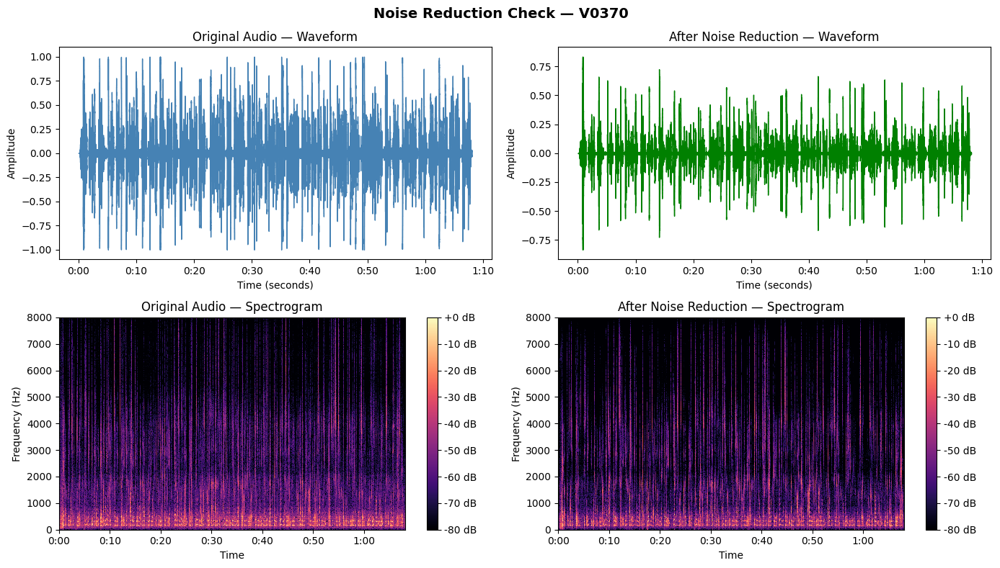

Plot saved to results/noise_check_V0370.png

=== AUDIO STATISTICS ===
Original  — Duration: 68.1s  Max amplitude: 1.0000  RMS energy: 0.1172
Processed — Duration: 68.1s  Max amplitude: 0.8340  RMS energy: 0.0531

Estimated noise reduction: 54.6%

=== LISTEN AND COMPARE ===
Playing ORIGINAL audio:


Playing PROCESSED audio (after noise reduction):


In [ ]:
# Check noise reduction results
# Compare original audio vs cleaned audio
# Visual check using waveform and spectrogram

import librosa
import librosa.display
import matplotlib.pyplot as plt
import soundfile as sf
import IPython.display as ipd
import numpy as np
import os


# choose one that had HIGH noise for best comparison
TEST_ID = 'V0370'   # change this to any ID you have audio for

raw_dir  = f'{BASE}/audio/raw'
proc_dir = f'{BASE}/audio/processed'

# find the original file (could be any format)
raw_path = None
for ext in ['.ogg', '.mp3', '.m4a', '.mp4', '.wav']:
    candidate = f'{raw_dir}/{TEST_ID}{ext}'
    if os.path.exists(candidate):
        raw_path = candidate
        break

wav_path = f'{proc_dir}/{TEST_ID}.wav'

if raw_path is None:
    print(f'Original file not found for {TEST_ID}')
elif not os.path.exists(wav_path):
    print(f'Processed file not found for {TEST_ID}')
else:
    print(f'Comparing: {TEST_ID}')
    print(f'Original:  {raw_path}')
    print(f'Processed: {wav_path}')
    print()

    # load both audio files
    original, sr_orig = librosa.load(raw_path,  sr=16000)
    cleaned,  sr_proc = librosa.load(wav_path,  sr=16000)

    # PLOT 1: Waveforms side by side
    fig, axes = plt.subplots(2, 2, figsize=(14, 8))
    fig.suptitle(f'Noise Reduction Check — {TEST_ID}', fontsize=14, fontweight='bold')

    # original waveform
    axes[0, 0].set_title('Original Audio — Waveform')
    librosa.display.waveshow(original, sr=sr_orig, ax=axes[0, 0], color='steelblue')
    axes[0, 0].set_xlabel('Time (seconds)')
    axes[0, 0].set_ylabel('Amplitude')

    # cleaned waveform
    axes[0, 1].set_title('After Noise Reduction — Waveform')
    librosa.display.waveshow(cleaned, sr=sr_proc, ax=axes[0, 1], color='green')
    axes[0, 1].set_xlabel('Time (seconds)')
    axes[0, 1].set_ylabel('Amplitude')

    # original spectrogram
    D_orig = librosa.amplitude_to_db(np.abs(librosa.stft(original)), ref=np.max)
    img1 = librosa.display.specshow(D_orig, sr=sr_orig, x_axis='time',
                                     y_axis='hz', ax=axes[1, 0])
    axes[1, 0].set_title('Original Audio — Spectrogram')
    axes[1, 0].set_ylabel('Frequency (Hz)')
    fig.colorbar(img1, ax=axes[1, 0], format='%+2.0f dB')

    # cleaned spectrogram
    D_proc = librosa.amplitude_to_db(np.abs(librosa.stft(cleaned)), ref=np.max)
    img2 = librosa.display.specshow(D_proc, sr=sr_proc, x_axis='time',
                                     y_axis='hz', ax=axes[1, 1])
    axes[1, 1].set_title('After Noise Reduction — Spectrogram')
    axes[1, 1].set_ylabel('Frequency (Hz)')
    fig.colorbar(img2, ax=axes[1, 1], format='%+2.0f dB')

    plt.tight_layout()
    plt.savefig(f'{BASE}/results/noise_check_{TEST_ID}.png', dpi=150)
    plt.show()
    print(f'Plot saved to results/noise_check_{TEST_ID}.png')

    # AUDIO STATS
    print('\n=== AUDIO STATISTICS ===')
    print(f'Original  — Duration: {len(original)/sr_orig:.1f}s  '
          f'Max amplitude: {np.max(np.abs(original)):.4f}  '
          f'RMS energy: {np.sqrt(np.mean(original**2)):.4f}')
    print(f'Processed — Duration: {len(cleaned)/sr_proc:.1f}s  '
          f'Max amplitude: {np.max(np.abs(cleaned)):.4f}  '
          f'RMS energy: {np.sqrt(np.mean(cleaned**2)):.4f}')

    noise_reduction_pct = (1 - np.sqrt(np.mean(cleaned**2)) /
                               np.sqrt(np.mean(original**2))) * 100
    print(f'\nEstimated noise reduction: {noise_reduction_pct:.1f}%')

    # LISTEN TO BOTH
    print('\n=== LISTEN AND COMPARE ===')
    print('Playing ORIGINAL audio:')
    display(ipd.Audio(original, rate=sr_orig))

    print('Playing PROCESSED audio (after noise reduction):')
    display(ipd.Audio(cleaned, rate=sr_proc))

Comparing: V0001
Original:  /content/drive/MyDrive/HeyCareLog_Dataset/audio/raw/V0001.mp4
Processed: /content/drive/MyDrive/HeyCareLog_Dataset/audio/processed/V0001.wav



/tmp/ipykernel_855/998579096.py:28: UserWarning: PySoundFile failed. Trying audioread instead.
  original, sr_orig = librosa.load(raw_path,  sr=16000)
/usr/local/lib/python3.12/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


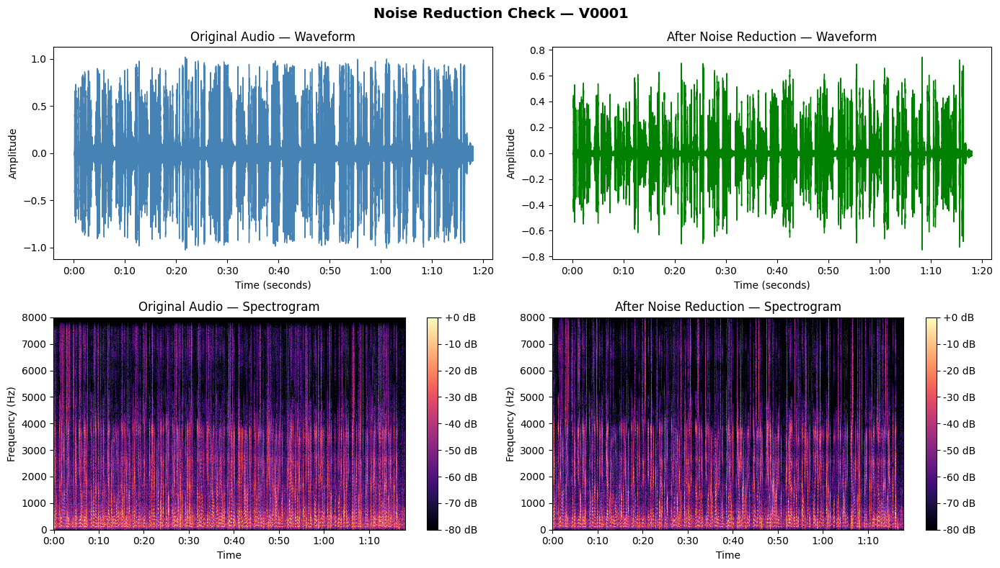

Plot saved to results/noise_check_V0001.png

=== AUDIO STATISTICS ===
Original  — Duration: 78.0s  Max amplitude: 1.0240  RMS energy: 0.1605
Processed — Duration: 78.0s  Max amplitude: 0.7469  RMS energy: 0.0729

Estimated noise reduction: 54.6%

=== LISTEN AND COMPARE ===
Playing ORIGINAL audio:


Playing PROCESSED audio (after noise reduction):


In [ ]:
# choose one that had HIGH noise for best comparison
TEST_ID = 'V0001'   # change this to any ID you have audio for

raw_dir  = f'{BASE}/audio/raw'
proc_dir = f'{BASE}/audio/processed'

# find the original file (could be any format)
raw_path = None
for ext in ['.ogg', '.mp3', '.m4a', '.mp4', '.wav']:
    candidate = f'{raw_dir}/{TEST_ID}{ext}'
    if os.path.exists(candidate):
        raw_path = candidate
        break

wav_path = f'{proc_dir}/{TEST_ID}.wav'

if raw_path is None:
    print(f'Original file not found for {TEST_ID}')
elif not os.path.exists(wav_path):
    print(f'Processed file not found for {TEST_ID}')
else:
    print(f'Comparing: {TEST_ID}')
    print(f'Original:  {raw_path}')
    print(f'Processed: {wav_path}')
    print()

    # load both audio files
    original, sr_orig = librosa.load(raw_path,  sr=16000)
    cleaned,  sr_proc = librosa.load(wav_path,  sr=16000)

    # PLOT 1: Waveforms side by side
    fig, axes = plt.subplots(2, 2, figsize=(14, 8))
    fig.suptitle(f'Noise Reduction Check — {TEST_ID}', fontsize=14, fontweight='bold')

    # original waveform
    axes[0, 0].set_title('Original Audio — Waveform')
    librosa.display.waveshow(original, sr=sr_orig, ax=axes[0, 0], color='steelblue')
    axes[0, 0].set_xlabel('Time (seconds)')
    axes[0, 0].set_ylabel('Amplitude')

    # cleaned waveform
    axes[0, 1].set_title('After Noise Reduction — Waveform')
    librosa.display.waveshow(cleaned, sr=sr_proc, ax=axes[0, 1], color='green')
    axes[0, 1].set_xlabel('Time (seconds)')
    axes[0, 1].set_ylabel('Amplitude')

    # original spectrogram
    D_orig = librosa.amplitude_to_db(np.abs(librosa.stft(original)), ref=np.max)
    img1 = librosa.display.specshow(D_orig, sr=sr_orig, x_axis='time',
                                     y_axis='hz', ax=axes[1, 0])
    axes[1, 0].set_title('Original Audio — Spectrogram')
    axes[1, 0].set_ylabel('Frequency (Hz)')
    fig.colorbar(img1, ax=axes[1, 0], format='%+2.0f dB')

    # cleaned spectrogram
    D_proc = librosa.amplitude_to_db(np.abs(librosa.stft(cleaned)), ref=np.max)
    img2 = librosa.display.specshow(D_proc, sr=sr_proc, x_axis='time',
                                     y_axis='hz', ax=axes[1, 1])
    axes[1, 1].set_title('After Noise Reduction — Spectrogram')
    axes[1, 1].set_ylabel('Frequency (Hz)')
    fig.colorbar(img2, ax=axes[1, 1], format='%+2.0f dB')

    plt.tight_layout()
    plt.savefig(f'{BASE}/results/noise_check_{TEST_ID}.png', dpi=150)
    plt.show()
    print(f'Plot saved to results/noise_check_{TEST_ID}.png')

    # AUDIO STATS
    print('\n=== AUDIO STATISTICS ===')
    print(f'Original  — Duration: {len(original)/sr_orig:.1f}s  '
          f'Max amplitude: {np.max(np.abs(original)):.4f}  '
          f'RMS energy: {np.sqrt(np.mean(original**2)):.4f}')
    print(f'Processed — Duration: {len(cleaned)/sr_proc:.1f}s  '
          f'Max amplitude: {np.max(np.abs(cleaned)):.4f}  '
          f'RMS energy: {np.sqrt(np.mean(cleaned**2)):.4f}')

    noise_reduction_pct = (1 - np.sqrt(np.mean(cleaned**2)) /
                               np.sqrt(np.mean(original**2))) * 100
    print(f'\nEstimated noise reduction: {noise_reduction_pct:.1f}%')

    # LISTEN TO BOTH
    print('\n=== LISTEN AND COMPARE ===')
    print('Playing ORIGINAL audio:')
    display(ipd.Audio(original, rate=sr_orig))

    print('Playing PROCESSED audio (after noise reduction):')
    display(ipd.Audio(cleaned, rate=sr_proc))

In [ ]:
# Final check

import pandas as pd, os

print('=== NOTEBOOK 01 FINAL CHECK ===\n')

files_to_check = [
    ('labels/master_labels.csv',       1209, 'full CSV'),
    ('labels/labels_with_audio.csv',   222,  'audio rows'),
    ('labels/labels_all_text.csv',     1209, 'all text rows'),
    ('labels/train_audio.csv',         177,  'audio train'),
    ('labels/val_audio.csv',           22,   'audio val'),
    ('labels/test_audio.csv',          23,   'audio test'),
    ('labels/train_text.csv',          967,  'text train'),
    ('labels/val_text.csv',            121,  'text val'),
    ('labels/test_text.csv',           121,  'text test'),
    ('labels/stage3_train.csv',        967,  'stage 3 features'),
    ('labels/stage5_train.csv',        967,  'stage 5 features'),
    ('labels/stage6_train.csv',        967,  'stage 6 features'),
]

all_ok = True
for fname, expected, desc in files_to_check:
    path = f'{BASE}/{fname}'
    if os.path.exists(path):
        actual = len(pd.read_csv(path))
        if actual == expected:
            print(f'  OK     {fname} ({desc})')
        else:
            print(f'  WRONG  {fname} - got {actual}, expected {expected}')
            all_ok = False
    else:
        print(f'  MISSING {fname}')
        all_ok = False

proc_dir = f'{BASE}/audio/processed'
if os.path.exists(proc_dir):
    wav_count = len([f for f in os.listdir(proc_dir) if f.endswith('.wav')])
    print(f'\n  Processed WAV files: {wav_count} (expected ~222)')

print()
if all_ok:
    print('Notebook 01 is complete!')
    print('Next step: open 02_asr_comparison.ipynb')
else:
    print('Some files are missing - check the cells above')

=== NOTEBOOK 01 FINAL CHECK ===

  OK     labels/master_labels.csv (full CSV)
  OK     labels/labels_with_audio.csv (audio rows)
  OK     labels/labels_all_text.csv (all text rows)
  OK     labels/train_audio.csv (audio train)
  OK     labels/val_audio.csv (audio val)
  OK     labels/test_audio.csv (audio test)
  OK     labels/train_text.csv (text train)
  OK     labels/val_text.csv (text val)
  OK     labels/test_text.csv (text test)
  OK     labels/stage3_train.csv (stage 3 features)
  OK     labels/stage5_train.csv (stage 5 features)
  OK     labels/stage6_train.csv (stage 6 features)

  Processed WAV files: 222 (expected ~222)

Notebook 01 is complete!
Next step: open 02_asr_comparison.ipynb
